In [1]:
import plotly.express as px
import plotly.graph_objects as go
import plotly.offline as pyo
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import itertools
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.cm as cm
import scipy.stats as stats
import scipy.interpolate as inter
idx = pd.IndexSlice
pyo.init_notebook_mode()


root_folder = r"C:\Users\jamen\Google Drive\Everything\Results\P1 Model\OvenHeatFluxSensor\\"
first_last = [0,60]
# name, first timestep, final timestep, timestep
areas = ["Sensor","Inlet","Outlet","Walls","BoundaryTC"] # prefix for each filename

Aim of this workbook is to answer three questions:
1. What is the effect on the flux into the "food" when changing various components of the mesh? Both the element sizing and the existance of an inflation layer are investigated.
2. What mesh settings give a good tradeoff between accuracy and computational requirements. Accuracy is judged by comparing results to those from the most refined meshes
3. What is the effect on the flux due to refinement in the heater mesh model. 

In [2]:
# read all data into the workbook
alldata = pd.read_feather(root_folder+"alldata.feather")

In [3]:
# create a dataframe for all meshes containing the mean values on the food for each time step
sensor_means=alldata[alldata['area']=="Sensor"].groupby(["position","area","time"]).mean()
sensor_means.reset_index(inplace=True)

In [4]:
# plot average flux vs time for each mesh
px.line(sensor_means,x="time",y="flux",color="position")

The above plot is used to decide when the simulation has reached steady state, this is taken as 20 seconds and used to filter out the transient part of the data below

In [5]:
alldata = alldata[alldata['time']>20]
sensor_means = sensor_means[sensor_means['time']>20]

In [13]:
alldata["boundaryT"] = np.nan
for position in alldata["position"].drop_duplicates():
    for time in alldata["time"].drop_duplicates():
        alldata.loc[(alldata["position"]==position)&(alldata["area"]=="Sensor")&(alldata["time"]==time),["boundaryT"]] = alldata.loc[(alldata["position"]==position)&(alldata["area"]=="BoundaryTC")&(alldata["time"]==time),]["T"].tolist()[0]
alldata["calc HTC"] = -alldata["convective flux"]/(alldata["boundaryT"]-alldata["setT"])

In [14]:
sensor_means=alldata[alldata['area']=="Sensor"].groupby(["position","area"]).mean()
sensor_means.reset_index(inplace=True)
sensor_means

,position,area,index,x,y,z,convective flux,T,flux,HTC,u,v,w,P,time,setT,radiative flux,boundaryT,calc HTC
0,0,Sensor,1181.5,0.201373,-0.015788,0.243390,-2193.152527,97.858321,-2821.837895,126.164392,0.077179,-0.000188,-0.091065,2.191848,40,80.0,-628.685368,193.181154,19.377487
1,1,Sensor,1181.5,0.201373,-0.015788,0.243390,-990.584021,88.117969,-1180.456654,123.647728,0.038067,-0.000049,-0.075542,1.843764,40,80.0,-189.872633,140.133752,16.472945
2,2,Sensor,1181.0,0.201346,-0.015788,0.353243,-1389.439190,91.119817,-1633.972085,124.466831,0.094735,-0.000094,0.048355,1.937680,40,80.0,-244.532895,139.423644,23.383049
3,3,Sensor,1259.0,0.201799,-0.015788,0.482754,-1090.005255,89.440441,-1396.866769,123.969671,0.072344,-0.000431,0.025689,1.787189,40,80.0,-306.861514,140.009401,18.163014
4,4,Sensor,2408.0,0.307227,-0.015788,0.242997,-714.760216,86.139147,-898.539835,123.136580,0.073179,-0.000021,-0.009157,1.741374,40,80.0,-183.779619,140.058393,11.907973
5,7,Sensor,539.5,0.202075,-0.000788,0.243019,-1386.401935,90.332355,-1573.367764,144.427779,0.084631,-0.005079,-0.077082,2.040248,40,80.0,-186.965829,119.472053,35.212520
6,8,Sensor,537.0,0.201892,-0.000788,0.353932,-1863.032092,93.500780,-2097.755327,145.159735,0.136599,-0.009230,0.047535,2.005069,40,80.0,-234.723235,121.653945,44.914301
7,10,Sensor,1018.0,0.307525,-0.000788,0.243501,-861.435782,86.481132,-1028.050414,143.644582,0.061259,0.006536,-0.013889,1.725002,40,80.0,-166.614632,104.257619,35.731870


In [120]:
contour_dfs = []
for position in alldata["position"].drop_duplicates():
    pos_df = alldata[(alldata['area']=="Sensor") & (alldata['position']==position)].groupby(['x','y','z']).mean()
    pos_df.reset_index(inplace=True)
    pos_df['position'] = position
    contour_dfs.append(pos_df)
contour_df = pd.concat(contour_dfs)
contour_df.reset_index(inplace=True)

Plot flux contour for each mesh

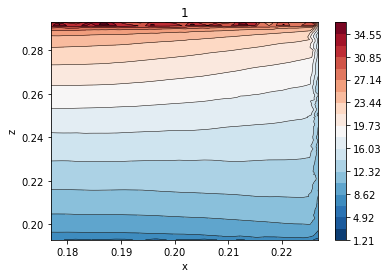

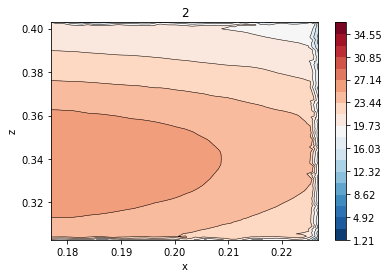

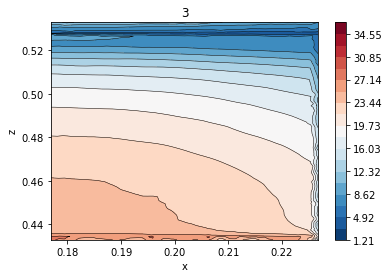

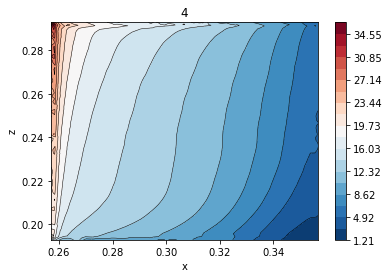

In [111]:
#%matplotlib qt

figs = []

plotvar = "calc HTC"

level_num = 20
levels = np.linspace(min(contour_df[plotvar]),max(contour_df[plotvar]),level_num)

for i in range(len(alldata["position"].drop_duplicates())):
    figs.append(plt.subplots(nrows=1))
    fig, ax = figs[i]
    positions = alldata["position"].drop_duplicates().tolist()
    plot_df = contour_df[contour_df['position'] == positions[i]]

    x = plot_df['x']
    y = plot_df['z']
    #z = df_combi[' Wall Heat Flux [ W m^-2 ]']
    z = plot_df[plotvar]

    ax.tricontour(x, y, z, linewidths=0.5, colors='k',levels=levels)
    cntr1 = ax.tricontourf(x, y, z, cmap="RdBu_r", levels=levels)
    fig.colorbar(cntr1, ax=ax)
    ax.set_xlabel('x')
    ax.set_ylabel('z')
    ax.set_title(positions[i])
plt.show()

To compare contours we need to put data on a common grid, to do this we interpolate the flux using scipy then project onto a common grid in a common dataframe. Creates a dataframe with x and z coordinates with the interpolated flux from each mesh. Two interpolators are used, a linear interpolator which makes the "RAW" columns and a smoothed cubic spline which creates the "SMOOTH" columns

In [20]:
resolution = 100 # number of x and y points
gridx = np.linspace(min(contour_df['x']),max(contour_df['x']),resolution)
gridz = np.linspace(min(contour_df['z']),max(contour_df['z']),resolution)

coords = []

for x in gridx:
    for z in gridz:
        coords.append([x,z])
        
interpolated_flux = pd.DataFrame({'x':[coord[0] for coord in coords],'z':[coord[1] for coord in coords]})

for i in range(len(meshes)): 
    mesh=meshes[i]
    calc_df = contour_df[contour_df['mesh'] == mesh[0]]
    cat_coord = list(zip(calc_df['x'],calc_df['z']))
    interpolator = inter.LinearNDInterpolator(cat_coord, calc_df['flux'],fill_value=np.NaN)
    interpolated_flux[mesh[0]] = interpolator(coords) 
interpolated_flux.dropna(axis=0, inplace=True)

Plotting the raw interpolated differences between the food fluxes

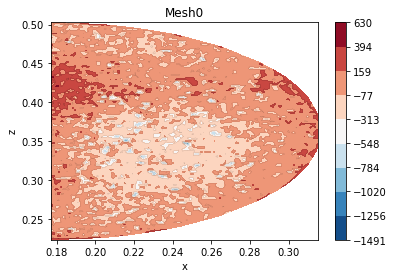

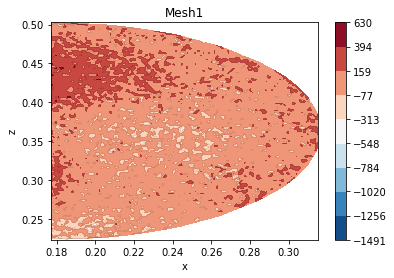

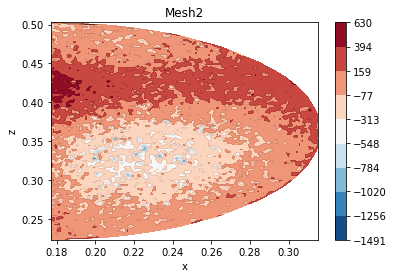

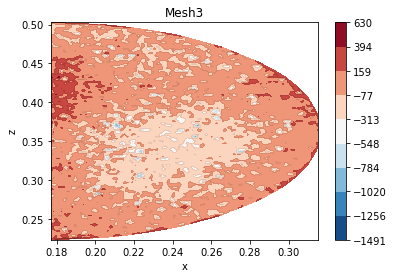

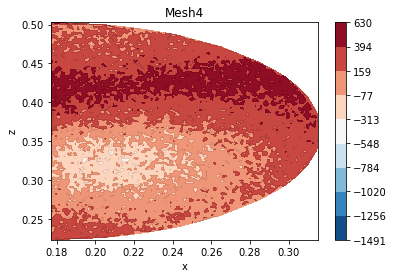

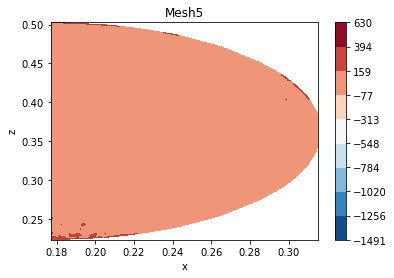

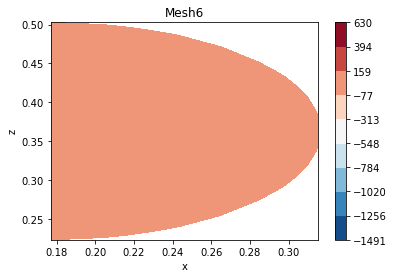

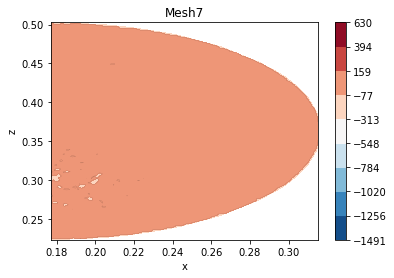

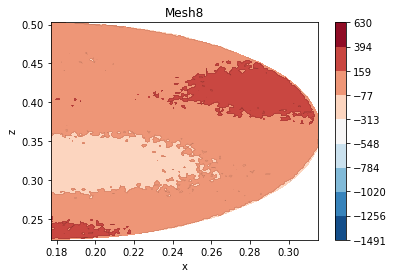

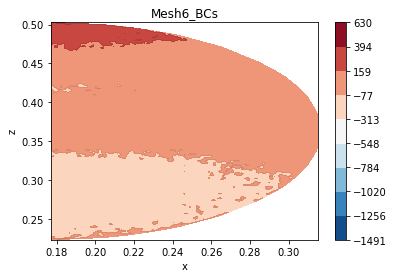

In [21]:
#%matplotlib qt

level_num = 10

mins = []
maxs= []

for i in range(len(meshes)):
    mesh = meshes[i]
    interpolated_flux[mesh[0]+"diff"] = interpolated_flux[mesh[0]] - interpolated_flux["Mesh6"]
    mins.append(min(interpolated_flux[mesh[0]+"diff"]))
    maxs.append(max(interpolated_flux[mesh[0]+"diff"]))

levels = np.linspace(min(mins),max(maxs),level_num)
figs = []

for i in range(len(meshes)):
    mesh = meshes[i]
    figs.append(plt.subplots(nrows=1))
    fig, ax = figs[i]

    x = interpolated_flux['x']
    y = interpolated_flux['z']
    #z = df_combi[' Wall Heat Flux [ W m^-2 ]']
    z = interpolated_flux[mesh[0]+"diff"]

    ax.tricontour(x, y, z, linewidths=0.1, colors='k',levels=levels)
    cntr1 = ax.tricontourf(x, y, z, cmap="RdBu_r", levels=levels)
    fig.colorbar(cntr1, ax=ax)
    ax.set_xlabel('x')
    ax.set_ylabel('z')
    ax.set_title(mesh[0])
plt.show()

The linearly interpolated data is a little too noisy to really draw conclusions from, therefore a smoothed data set was created using Scipy's inbuilt radial basis function Rbf. Smoothing can be controlled using the smoothing parameter, a new set of columns ("smoothed") are added to the dataframe and the base values and difference plotted.

Note that the Rbf is not applied to the raw data as it is too computationally expensive

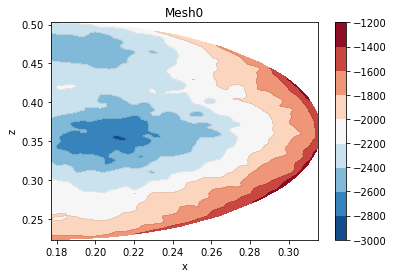

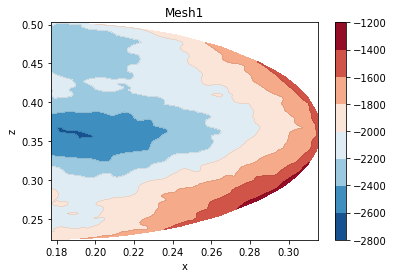

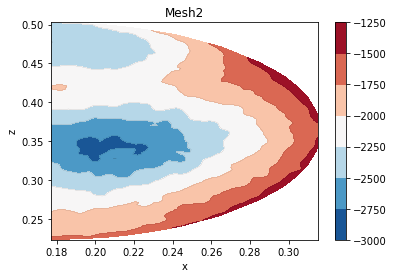

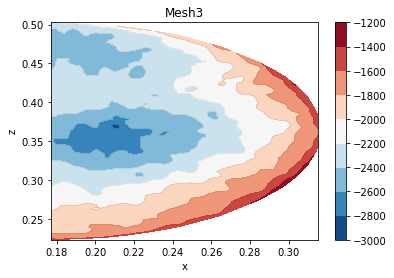

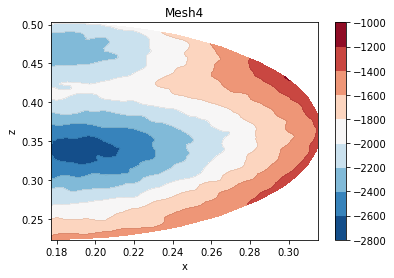

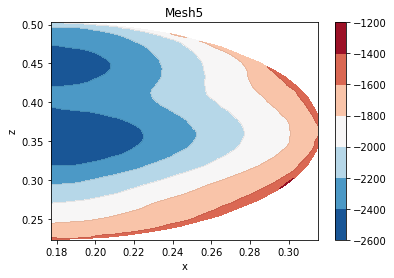

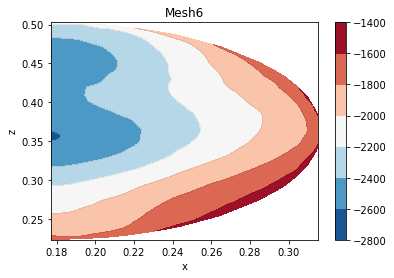

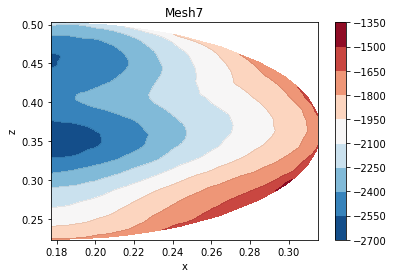

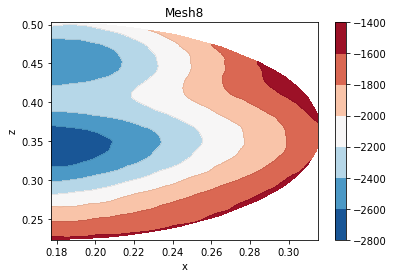

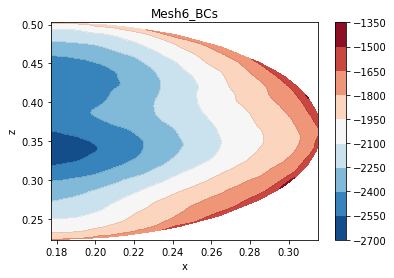

In [22]:
figs = []

smoothing = 10 # 1 appears a little low, 10 appears about right

for i in range(len(meshes)): 
    mesh=meshes[i]
    interpolator = inter.Rbf(interpolated_flux['x'],
                            interpolated_flux['z'],
                            interpolated_flux[mesh[0]],
                            smooth=smoothing)
    interpolated_flux[mesh[0]+"SMOOTHED"] = interpolator(interpolated_flux["x"],
                                                        interpolated_flux["z"])  


    figs.append(plt.subplots(nrows=1))
    fig, ax = figs[i]

    x = interpolated_flux['x']
    y = interpolated_flux['z']
    #z = df_combi[' Wall Heat Flux [ W m^-2 ]']
    z = interpolated_flux[mesh[0]+"SMOOTHED"]

    ax.tricontour(x, y, z, linewidths=0.1, colors='k')
    cntr1 = ax.tricontourf(x, y, z, cmap="RdBu_r")
    fig.colorbar(cntr1, ax=ax)
    ax.set_xlabel('x')
    ax.set_ylabel('z')
    ax.set_title(mesh[0])
plt.show()

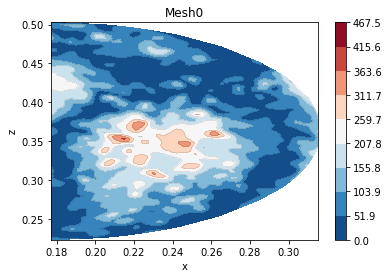

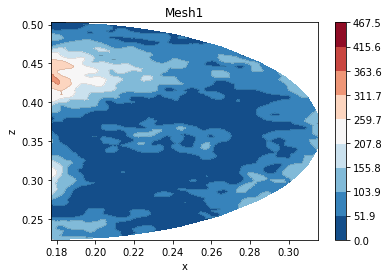

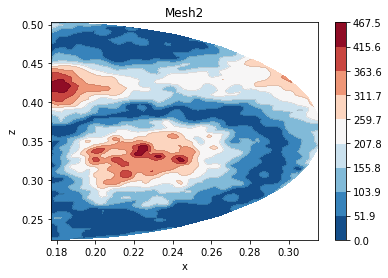

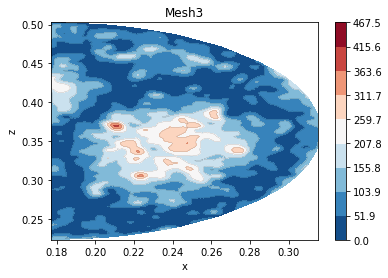

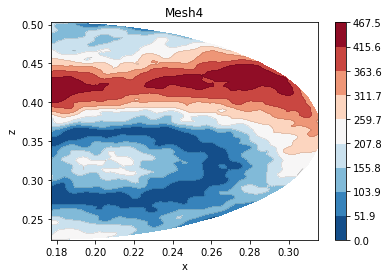

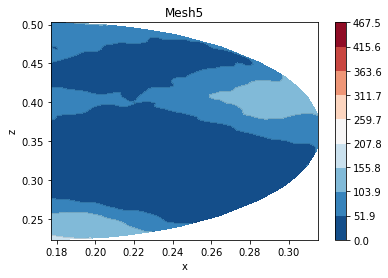

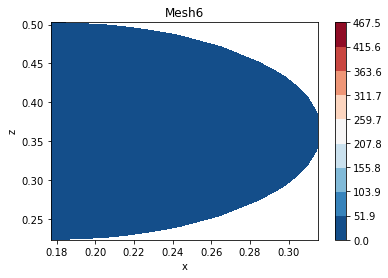

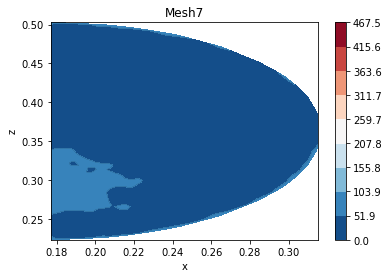

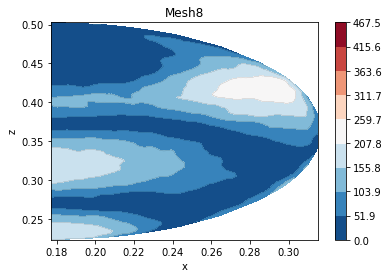

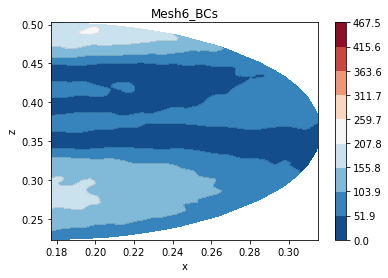

In [23]:
#%matplotlib qt

compared_to = "Mesh6"

level_num = 10

mins = []
maxs= []

for i in range(len(meshes)):
    mesh = meshes[i]
    interpolated_flux[mesh[0]+"SMOOTHEDdiff"] = abs(interpolated_flux[mesh[0]+"SMOOTHED"] - 
                                                    interpolated_flux[compared_to+"SMOOTHED"])
    mins.append(min(interpolated_flux[mesh[0]+"SMOOTHEDdiff"]))
    maxs.append(max(interpolated_flux[mesh[0]+"SMOOTHEDdiff"]))

levels = np.linspace(min(mins),max(maxs),level_num)
figs = []

for i in range(len(meshes)):
    mesh = meshes[i]
    figs.append(plt.subplots(nrows=1))
    fig, ax = figs[i]

    x = interpolated_flux['x']
    y = interpolated_flux['z']
    #z = df_combi[' Wall Heat Flux [ W m^-2 ]']
    z = interpolated_flux[mesh[0]+"SMOOTHEDdiff"]

    ax.tricontour(x, y, z, linewidths=0.1, colors='k',levels=levels)
    cntr1 = ax.tricontourf(x, y, z, cmap="RdBu_r", levels=levels)
    fig.colorbar(cntr1, ax=ax)
    ax.set_xlabel('x')
    ax.set_ylabel('z')
    ax.set_title(mesh[0])
plt.show()

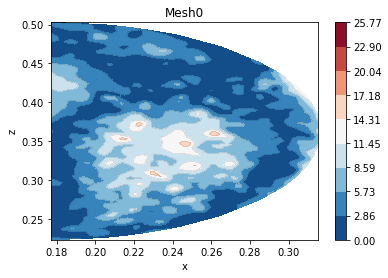

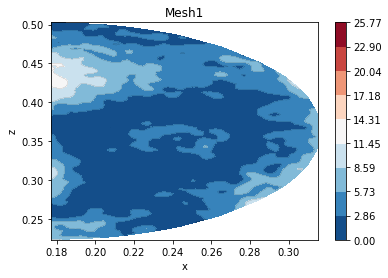

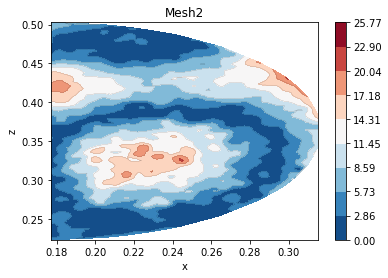

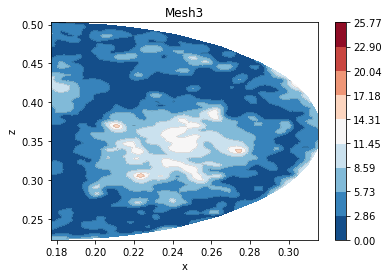

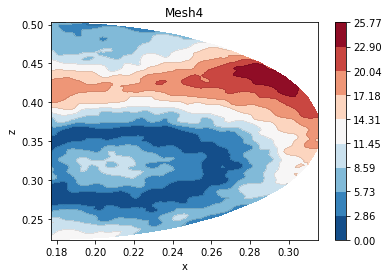

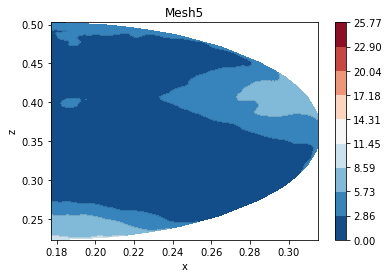

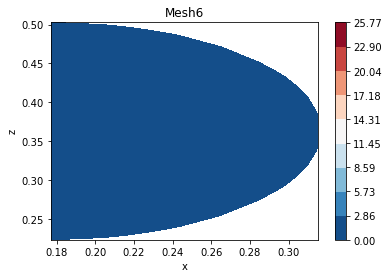

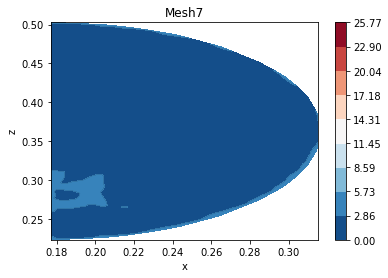

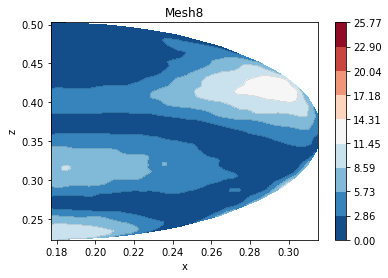

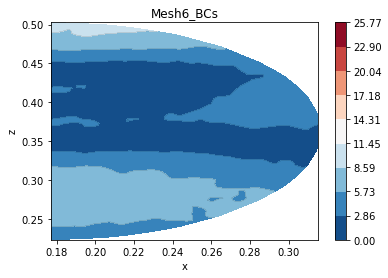

In [32]:
#%matplotlib qt

compared_to = "Mesh6"

level_num = 10

mins = []
maxs= []

for i in range(len(meshes)):
    mesh = meshes[i]
    interpolated_flux[mesh[0]+"SMOOTHEDfractionaldiff"] = abs(interpolated_flux[mesh[0]+"SMOOTHED"] - 
                                                    interpolated_flux[compared_to+"SMOOTHED"]) \
                                                    /abs(interpolated_flux[compared_to+"SMOOTHED"]) *100
    mins.append(min(interpolated_flux[mesh[0]+"SMOOTHEDfractionaldiff"]))
    maxs.append(max(interpolated_flux[mesh[0]+"SMOOTHEDfractionaldiff"]))

levels = np.linspace(min(mins),max(maxs),level_num)
figs = []

for i in range(len(meshes)):
    mesh = meshes[i]
    figs.append(plt.subplots(nrows=1))
    fig, ax = figs[i]

    x = interpolated_flux['x']
    y = interpolated_flux['z']
    #z = df_combi[' Wall Heat Flux [ W m^-2 ]']
    z = interpolated_flux[mesh[0]+"SMOOTHEDfractionaldiff"]

    ax.tricontour(x, y, z, linewidths=0.1, colors='k',levels=levels)
    cntr1 = ax.tricontourf(x, y, z, cmap="RdBu_r", levels=levels)
    fig.colorbar(cntr1, ax=ax)
    ax.set_xlabel('x')
    ax.set_ylabel('z')
    ax.set_title(mesh[0])
plt.show()

Differences between Mesh 6 and Mesh 6 when run with the boundary conditions from the most refined heater mesh are not negligible, perhaps have to use more refined heater mesh in future calculations, highest percentage errors are ~12%. TBH can probably ignore that. Maybe see what the difference is in the heat flux sensor comparison experiments.

In [26]:
mesh_mean = food_means.groupby(['mesh']).mean()
px.scatter(mesh_mean,x="Inflation (first layer thickness)",y="flux")

In [26]:
mesh_mean = food_means.groupby(['mesh']).mean()
px.scatter(mesh_mean,x="elements",y="flux")

Based on the above plots going to use Mesh 6 going forwards,  has a low element count and rapid convergence while having very similar numerical results to the most refined meshes

In [19]:
alldata

,index,x,y,z,convective flux,T,flux,HTC,u,v,w,P,time,area,position,radiative flux,calc HTC
201600,0,0.182309,-0.015788,0.230971,-916.542969,360.637695,-1125.377200,123.493126,0.005174,0.000147,-0.093425,1.759512,21,Sensor,1,-208.834231,NaN
201601,1,0.180781,-0.015788,0.231817,-922.964294,360.694550,-1062.829470,123.509216,0.003898,0.000164,-0.094341,1.762285,21,Sensor,1,-139.865176,NaN
201602,2,0.180613,-0.015788,0.230316,-910.328125,360.599884,-1125.664060,123.482628,0.003523,0.000135,-0.093023,1.757560,21,Sensor,1,-215.335935,NaN
201603,3,0.181952,-0.015788,0.259330,-1182.738040,362.562714,-1406.491460,124.014397,0.011518,-0.000034,-0.110405,1.880675,21,Sensor,1,-223.753420,NaN
201604,4,0.180816,-0.015788,0.260321,-1194.438350,362.640198,-1397.896360,124.033798,0.009172,-0.000037,-0.110656,1.886492,21,Sensor,1,-203.458010,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2461413,5871,0.256205,0.333231,0.170451,NaN,376.549377,-234.773056,6.881104,0.404965,-0.012263,-0.047781,1.745400,59,Walls,4,NaN,0.0
2461414,5872,0.254445,0.333232,0.165124,NaN,372.711548,-307.344788,6.825699,0.407334,-0.045576,-0.062134,1.742670,59,Walls,4,NaN,0.0
2461415,5873,0.251405,0.333236,0.173908,NaN,378.341156,-240.115082,7.290571,0.433140,-0.005323,-0.032577,1.737730,59,Walls,4,NaN,0.0
2461416,5874,0.245919,0.333241,0.170036,NaN,377.680328,-240.323166,7.307727,0.461550,-0.016566,-0.064230,1.729612,59,Walls,4,NaN,0.0


In [63]:
alldata["boundaryTemp"] = np.nan
for position in alldata["position"].drop_duplicates():
    for time in alldata["time"].drop_duplicates():
        alldata.loc[(alldata["position"]==position)&(alldata["area"]=="Sensor")&(alldata["time"]==time),["boundaryTemp"]] = alldata.loc[(alldata["position"]==position)&(alldata["area"]=="BoundaryTC")&(alldata["time"]==time),]["T"].tolist()[0]
alldata["calc HTC"] = -alldata["convective flux"]/(alldata["boundaryTemp"]-alldata["T"])

In [99]:
position = 2
time  = 40
alldata.loc[(alldata["position"]==position)&(alldata["area"]=="Sensor")&(alldata["time"]==time),["setT"]]

,setT
961172,353
961173,353
961174,353
961175,353
961176,353
...,...
963530,353
963531,353
963532,353
963533,353
